# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
#only if you have jupyterthemes
from jupyterthemes import jtplot
jtplot.style()

### Download Cifar10 dataset

In [2]:
torch.cuda.is_available()

True

In [3]:
DATA_PATH = "data\\cifar\\"
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

# Train dataset
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [4]:
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: data\cifar\
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [5]:
train_loader.batch_size

64

In [6]:
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[-9.0823e-01, -9.3999e-01, -9.3999e-01,  ..., -1.0670e+00,
           -1.0829e+00, -1.0829e+00],
          [-8.6060e-01, -9.2411e-01, -9.3999e-01,  ..., -1.0352e+00,
           -1.0352e+00, -1.0352e+00],
          [-8.6060e-01, -9.0823e-01, -9.5586e-01,  ..., -1.0352e+00,
           -1.0352e+00, -1.0194e+00],
          ...,
          [ 4.4130e-01,  2.5077e-01,  4.0954e-01,  ...,  6.1594e-01,
            5.3656e-01,  4.4130e-01],
          [ 4.4376e-02,  6.0253e-02,  3.3016e-01,  ...,  1.7139e-01,
            1.7139e-01,  4.8893e-01],
          [-1.7790e-01,  1.5551e-01,  6.6357e-01,  ..., -3.5008e-02,
            3.6191e-01,  8.3822e-01]],

         [[-7.4090e-01, -7.8932e-01, -7.8932e-01,  ..., -9.3456e-01,
           -9.5070e-01, -9.5070e-01],
          [-7.0863e-01, -7.7318e-01, -7.8932e-01,  ..., -9.0228e-01,
           -9.0228e-01, -9.0228e-01],
          [-7.2476e-01, -7.7318e-01, -8.2159e-01,  ..., -9.1842e-01,
           -9.0228e-01, -8.8615e-01],
          ...,
     

### Using  GPUs

In [7]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cuda


### Mostrar imágenes

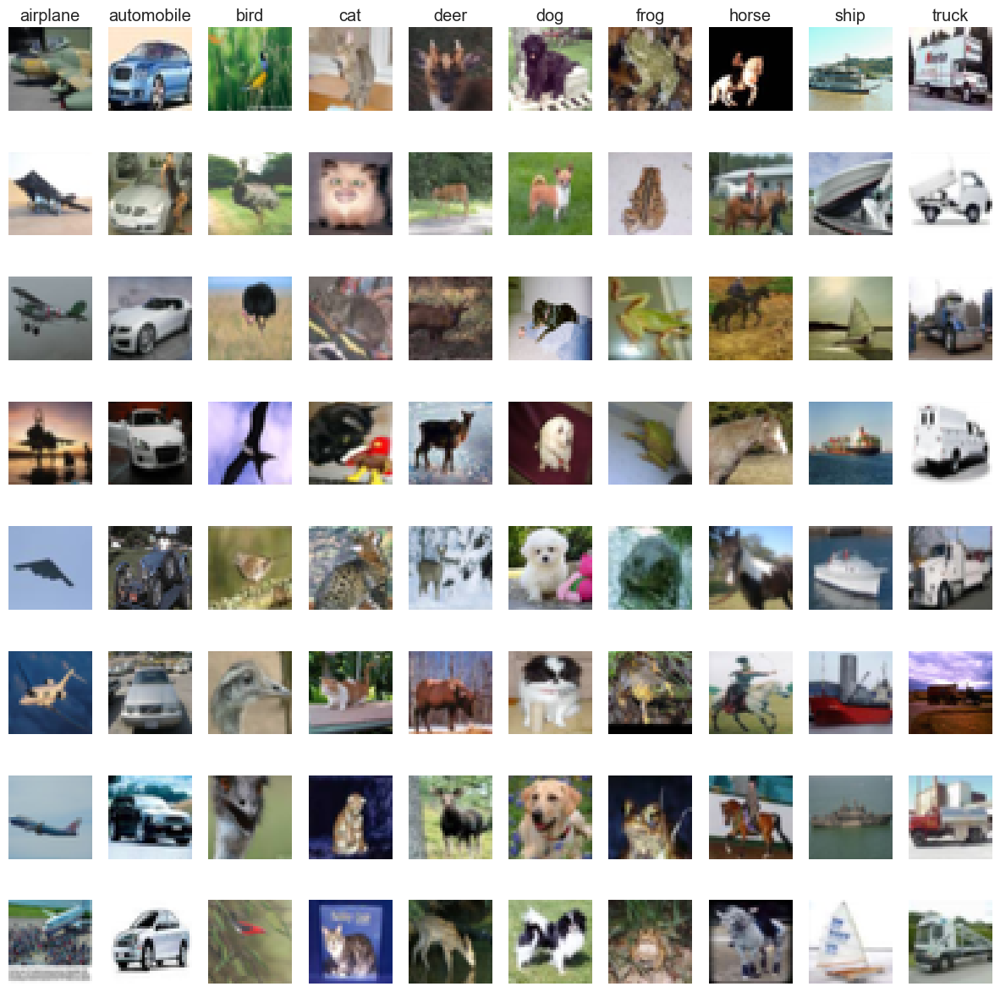

In [111]:
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Calcular accuracy


In [10]:
def accuracy(model, data_loader, device='cuda'):
    model.eval()  # Set the model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():  # Disable gradient computation for evaluation
        for inputs, labels in data_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)  # Get the predicted class

            # Update correct predictions and total number of samples
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
    
    # Calculate accuracy
    accuracy = correct / total
    return accuracy

### Loop de entrenamiento

In [56]:
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0005):
        """
        Args:
            patience (int): How many epochs to wait after last time validation loss improved.
            min_delta (float): Minimum change in the monitored value to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_val_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_val_loss is None:
            self.best_val_loss = val_loss
        elif val_loss > self.best_val_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                print(f"\n-------------------------------------------------------------------------------------")
                print(f"\nEarly stopping triggered. Validation loss has not improved in {self.patience} epochs.")
                self.early_stop = True
        else:
            self.best_val_loss = val_loss
            self.counter = 0

def train(model, optimiser, train_loader, val_loader, epochs=100, device='cuda', patience=10, log_interval = 1):
    model = model.to(device)
    early_stopping = EarlyStopping(patience=patience)  # Initialize EarlyStopping
    best_val_loss = float('inf')  # To track the best validation loss

    for epoch in range(epochs):
        model.train()  # Set model to training mode
        train_correct_num = 0.
        train_total = 0.
        train_cost_acum = 0.
        
        # Training loop
        for mb, (xi, yi) in enumerate(train_loader, 1):
            xi = xi.to(device)
            yi = yi.to(device)
            
            # Forward pass
            scores = model(xi)
            cost = F.cross_entropy(scores, yi)
            
            # Backward pass and optimization
            optimiser.zero_grad()
            cost.backward()
            optimiser.step()
            
            # Accuracy calculations during training
            train_correct_num += (scores.argmax(dim=1) == yi).sum().item()
            train_total += yi.size(0)
            train_cost_acum += cost.item()
        
        # Validation accuracy and loss calculation
        model.eval()
        val_loss = 0.0
        val_correct_num = 0
        with torch.no_grad():
            for val_x, val_y in val_loader:
                val_x, val_y = val_x.to(device), val_y.to(device)
                val_output = model(val_x)
                val_loss += F.cross_entropy(val_output, val_y).item()
                val_correct_num += (val_output.argmax(dim=1) == val_y).sum().item()
        
        val_loss /= len(val_loader)
        val_acc = val_correct_num / len(val_loader.dataset)
        
        # Early stopping check
        early_stopping(val_loss)
        if early_stopping.early_stop:
            print(f"\n-------------------------------------------------------------------------------------")
            print(f"\nTraining stopped early at epoch {epoch}")
            print(f'\nEpoch: {epoch}, train cost: {train_cost:.6f},'
                  f' train acc: {train_acc:.4f}, val acc: {val_acc:.4f},'
                  f' val loss: {val_loss:.6f}, lr: {optimiser.param_groups[0]["lr"]:.6f}')
            break
        
        # Calculate and print train results
        train_acc = train_correct_num / train_total
        train_cost = train_cost_acum / mb
        
        if epoch % log_interval == 0:
            print(f'Epoch: {epoch}, train cost: {train_cost:.6f},'
                  f' train acc: {train_acc:.4f}, val acc: {val_acc:.4f},'
                  f' val loss: {val_loss:.6f}')

### Linear model

In [12]:
# To do: Use PyTorch to create a linear model to have an initial baseline model

In [13]:
class LinearModel(nn.Module):
    def __init__(self, input_size, num_classes):
        super(LinearModel, self).__init__()
        # CIFAR-10 images are 32x32x3, so the input size is 32*32*3 = 3072
        self.fc = nn.Linear(input_size, num_classes)
    
    def forward(self, x):
        # Flatten the input (batch_size, 3, 32, 32) to (batch_size, 3072)
        x = x.view(x.size(0), -1)
        out = self.fc(x)
        return out

In [14]:
# CIFAR-10 images are 32x32 pixels and have 3 channels (RGB)
input_size = 32 * 32 * 3  # 3072
num_classes = 10          # CIFAR-10 has 10 classes

# Create model instance
model = LinearModel(input_size, num_classes)

In [15]:
import torch.optim as optim
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

In [33]:
train(model, optimizer, train_loader, val_loader, epochs=100, device=device, patience=10, log_interval=5)

Epoch: 0, train cost: 3.299655, train acc: 0.3238, val acc: 0.1431, val loss: 3.704671
Epoch: 5, train cost: 3.299613, train acc: 0.3238, val acc: 0.1431, val loss: 3.677321
Epoch: 10, train cost: 3.300266, train acc: 0.3238, val acc: 0.1431, val loss: 3.691759
Epoch: 15, train cost: 3.299084, train acc: 0.3238, val acc: 0.1431, val loss: 3.689773
Epoch: 20, train cost: 3.300868, train acc: 0.3238, val acc: 0.1431, val loss: 3.695145
Epoch: 25, train cost: 3.299609, train acc: 0.3238, val acc: 0.1431, val loss: 3.692591
Epoch: 30, train cost: 3.298875, train acc: 0.3238, val acc: 0.1431, val loss: 3.685613

-------------------------------------------------------------------------------------

Early stopping triggered. Validation loss has not improved in 10 epochs.

-------------------------------------------------------------------------------------

Training stopped early at epoch 31

Epoch: 31, train cost: 3.298875, train acc: 0.3238, val acc: 0.1431, val loss: 3.687585, lr: 0.010000

In [35]:
val_acc = accuracy(model, val_loader, device=device)
test_acc = accuracy(model, test_loader, device=device)

print(f'Validation Accuracy: {val_acc * 100:.2f}%')
print(f'Test Accuracy: {test_acc * 100:.2f}%')

Validation Accuracy: 28.62%
Test Accuracy: 27.60%


### Sequential CNN

In [39]:
import torch.nn as nn
import torch.nn.functional as F

class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        # First convolutional layer: input channels = 3 (RGB), output channels = 32, kernel size = 3x3
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)

        # Max-pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 4 * 4, 256)  # 4x4 is the size after pooling
        self.fc2 = nn.Linear(256, 10)  # CIFAR-10 has 10 output classes

        # Dropout for regularization
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        # Convolutional layers + activation + pooling
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Flatten the output from the convolutional layers
        x = x.view(-1, 128 * 4 * 4)

        # Fully connected layers with dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

In [58]:
# Instantiate the model

cnn_model = CNNModel()
cnn_optimizer = optim.SGD(cnn_model.parameters(), lr=0.01, momentum=0.9)
cnn_model.to(device)

CNNModel(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=2048, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=10, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [59]:
train(cnn_model, cnn_optimizer, train_loader, val_loader, epochs=100, device=device, patience=20, log_interval=4)

Epoch: 0, train cost: 1.630717, train acc: 0.4046, val acc: 0.2752, val loss: 1.255911
Epoch: 4, train cost: 0.718116, train acc: 0.7508, val acc: 0.3717, val loss: 0.747339
Epoch: 8, train cost: 0.470235, train acc: 0.8337, val acc: 0.3903, val loss: 0.686606
Epoch: 12, train cost: 0.341847, train acc: 0.8795, val acc: 0.3912, val loss: 0.755802
Epoch: 16, train cost: 0.271035, train acc: 0.9049, val acc: 0.3869, val loss: 0.868592
Epoch: 20, train cost: 0.231731, train acc: 0.9197, val acc: 0.3827, val loss: 1.010867
Epoch: 24, train cost: 0.215620, train acc: 0.9266, val acc: 0.3884, val loss: 1.121460

-------------------------------------------------------------------------------------

Early stopping triggered. Validation loss has not improved in 20 epochs.

-------------------------------------------------------------------------------------

Training stopped early at epoch 28

Epoch: 28, train cost: 0.208106, train acc: 0.9284, val acc: 0.3826, val loss: 1.170635, lr: 0.010000


In [60]:
val_acc = accuracy(cnn_model, val_loader, device=device)
test_acc = accuracy(cnn_model, test_loader, device=device)

print(f'Validation Accuracy: {val_acc * 100:.2f}%')
print(f'Test Accuracy: {test_acc * 100:.2f}%')

Validation Accuracy: 76.52%
Test Accuracy: 76.54%


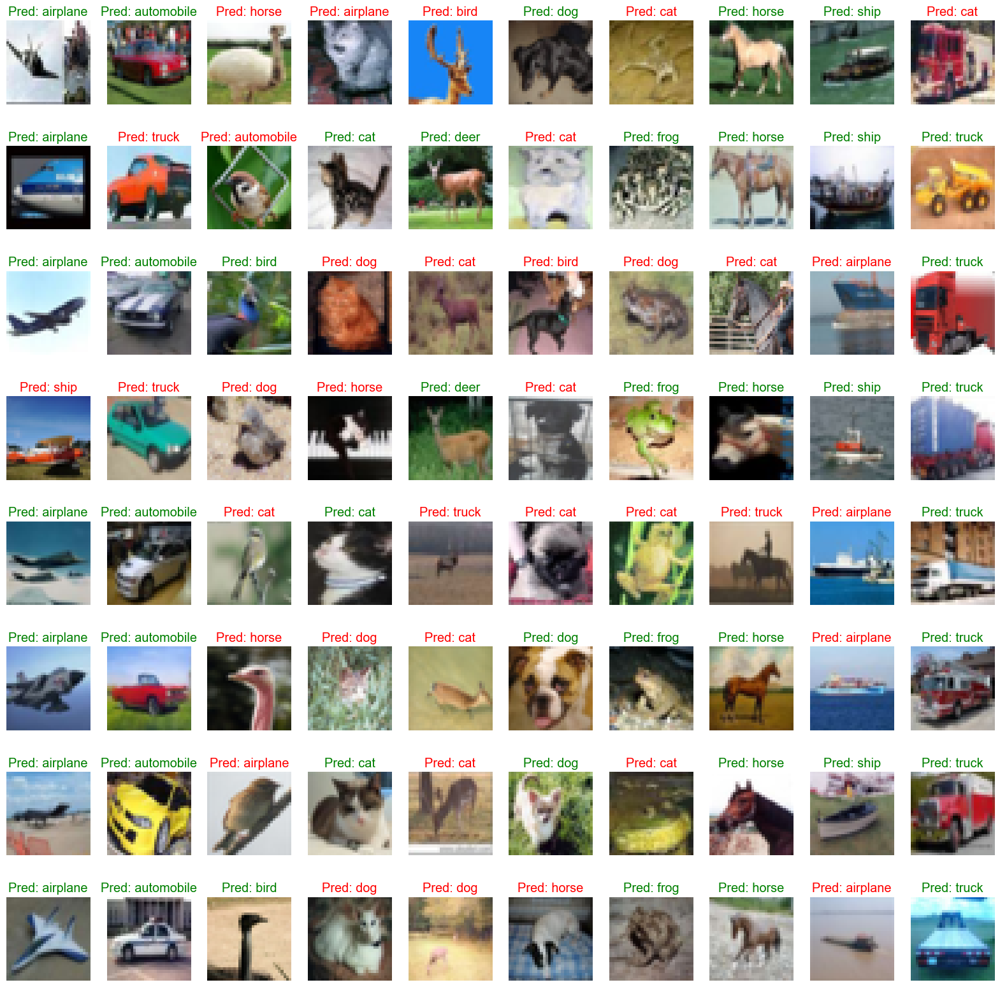

In [85]:
def plot_cifar10_grid(model, data_loader, device='cuda'):
    model.eval()  # Set model to evaluation mode
    classes = data_loader.dataset.classes
    total_samples = 8  # Number of samples per class
    plt.figure(figsize=(20, 20))
    
    # Iterate over each class
    for label, class_name in enumerate(classes):
        # Find indices for samples of this class
        class_idxs = np.flatnonzero(np.array(data_loader.dataset.targets) == label)
        sample_idxs = np.random.choice(class_idxs, total_samples, replace=False)

        # Plot each sample
        for i, idx in enumerate(sample_idxs):
            plt_idx = i * len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)

            # Get the image and true label
            img = data_loader.dataset.data[idx]
            true_label = label
            
            # Prepare the image for the model (normalization, etc.)
            img_tensor = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
            img_tensor = img_tensor.to(device)
            
            # Get the predicted label
            with torch.no_grad():
                output = model(img_tensor)  # Divide by 255 to normalize
                predicted_label = output.argmax(dim=1).item()
            
            # Display the image
            plt.imshow(img)
            plt.axis('off')
            
            # Check if prediction is correct and adjust title color
            if predicted_label == true_label:
                title_color = 'green'
            else:
                title_color = 'red'

            # Add the predicted label as the title
            plt.title(f'Pred: {classes[predicted_label]}', color=title_color)
        
        # Label the first image of each class with the true class name
        if i == 0:
            plt.title(f'True: {class_name}', fontsize=14)

    plt.show()

# Usage example:
plot_cifar10_grid(cnn_model, test_loader, device=device)

In [86]:
import torch
import numpy as np

def accuracy_per_label(model, data_loader, device='cuda'):
    model.eval()  # Cambiar el modelo a modo de evaluación
    classes = data_loader.dataset.classes  # Las clases (etiquetas)
    class_correct = np.zeros(len(classes))  # Contador de predicciones correctas por clase
    class_total = np.zeros(len(classes))  # Contador total por clase
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            correct = (predicted == labels).squeeze()
            
            # Contabilizar la precisión por cada clase
            for i in range(labels.size(0)):
                label = labels[i].item()  # Obtener la etiqueta real
                class_correct[label] += correct[i].item()
                class_total[label] += 1
    
    # Imprimir la precisión por cada clase
    for i in range(len(classes)):
        if class_total[i] > 0:
            print(f'Precisión de {classes[i]}: {100 * class_correct[i] / class_total[i]:.2f}% ({int(class_correct[i])}/{int(class_total[i])})')
        else:
            print(f'Precisión de {classes[i]}: N/A (No hay muestras)')


In [87]:
accuracy_per_label(cnn_model, test_loader, device='cuda')

Precisión de airplane: 74.61% (382/512)
Precisión de automobile: 88.89% (440/495)
Precisión de bird: 64.34% (314/488)
Precisión de cat: 60.64% (305/503)
Precisión de deer: 71.60% (353/493)
Precisión de dog: 70.12% (359/512)
Precisión de frog: 87.82% (447/509)
Precisión de horse: 78.81% (398/505)
Precisión de ship: 80.44% (399/496)
Precisión de truck: 88.30% (430/487)
